<a href="https://colab.research.google.com/github/Mammad-AI/IAAA_MMD_AI/blob/main/second_densenet_checking_augmentatio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install the necessary packages for working with DICOM files and MONAI
!pip install pydicom
!pip install monai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 66.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.0 MB/s eta 0:00:00


In [ ]:
# Uploading files from the user's local system
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mohammadpourmazahery","key":"6fea11414884209611b85dbd61351ce5"}'}

In [ ]:
import monai

In [ ]:
# Importing the necessary libraries for data processing and model building
import random
import pandas as pd  # For handling CSV files and dataframes
import os  # For interacting with the file system
import pydicom  # For working with DICOM files
import matplotlib.pyplot as plt  # For visualizations
import seaborn as sns  # For enhanced data visualizations
from tqdm import tqdm  # For progress bars in loops
import pydicom as dicom  # Alias for pydicom
from pydicom import dcmread  # To read DICOM files
from pydicom.data import get_testdata_file  # To access sample DICOM data
from pydicom.pixel_data_handlers.util import apply_voi_lut  # Utility to handle DICOM pixel data transformations
import torchvision.models as models  # For pre-trained models
import numpy as np  # For array manipulations
from sklearn.metrics import accuracy_score  # For evaluating classification models
from tensorflow.keras.preprocessing.image import load_img, img_to_array  # For image preprocessing in Keras
from natsort import natsorted  # For natural sorting
import cv2  # For image processing
import math  # For mathematical operations
from torch.utils.data import ConcatDataset, DataLoader, Dataset, Subset # import ConcatDataset
import torch.nn.functional as F  # For using various functions in PyTorch
import torch.nn as nn  # For building neural networks
import torch.optim as optim  # For optimization algorithms
from sklearn.model_selection import KFold  # For K-Fold cross-validation
import sys  # For system-related functions
import torch  # PyTorch library


from monai.networks.nets import DenseNet121  # For using DenseNet architecture
from monai.data import Dataset, CacheDataset  # For handling medical datasets
from monai.utils import set_determinism  # For reproducibility in training
from sklearn.model_selection import train_test_split


In [ ]:
from monai.transforms import Compose, EnsureChannelFirst, RandRotate90, RandFlip, RandZoom


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
model = monai.networks.nets.DenseNet121(spatial_dims=3, in_channels=1, out_channels=2).to(device)
model.features.transition3.pool=nn.AvgPool3d(kernel_size=(1,2,2), stride=(1,2,2))
model.class_layers.out = nn.Sequential(
    nn.Linear(1024, 2),  # Replace 1024 with the actual input size of your fc layer
    nn.Softmax(dim=1)  # Apply softmax activation
)

best_model_path = '/content/drive/My Drive/best_model_dense_layer.pth'
#model.load_state_dict(torch.load(best_model_path))

In [ ]:
# Download and unzip the MRI dataset from Kaggle
!kaggle datasets download -d iaaaplatform/iaaa-mri-challenge
!unzip iaaa-mri-challenge.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407242432073.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407242437074.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407242443075.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407242448076.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407242453077.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407245301078.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.2024022407234101045/1.3.46.670589.11.10042.5.0.7984.2024022407245306079.dcm  
  inflating: data/1.3.46.670589.11.10042.5.0.7984.202

In [ ]:
# Define paths and load the training labels from the CSV file
data_dir = 'data'
train_label = pd.read_csv('train.csv')

In [ ]:
series_list=os.listdir('data')

In [ ]:
# Function to sort DICOM files by slice number based on a specific DICOM tag
def sort_dicom_files(paths):
    sorted_files = [np.nan] * 24  # Initialize a list to store sorted files
    for i in range(len(paths)):
        dicom = pydicom.dcmread(paths[i])  # Read each DICOM file
        slice_number_mr_tag = (0x2001, 0x100a)  # DICOM tag for slice number
        slice_number_mr_value = int(dicom[slice_number_mr_tag].value)  # Get the slice number
        sorted_files[(slice_number_mr_value - 1)] = paths[i]  # Place the file in the correct position
    filtered_paths = [path for path in sorted_files if not isinstance(path, float)]  # Remove empty slots
    return filtered_paths  # Return the sorted list of paths


In [ ]:
# Function to generate labels based on the `SeriesInstanceUID`
def produce_label(SeriesInstanceUID, train_label):
    label = train_label[train_label.SeriesInstanceUID == SeriesInstanceUID].prediction
    # If no label is found, default to [1,0]
    if label.empty:
        label = torch.tensor([1, 0])
    else:
        if label.iloc[0] == 0:
            label = torch.tensor([1, 0])
        else:
            label = torch.tensor([0, 1])
    return label



In [ ]:
# Function to standardize DICOM files and resize them to a specific shape
def standardize_dicom(serie_id):
    path1 = f'data/{serie_id}'
    paths = []
    for i in os.listdir(path1):
        paths.append(os.path.join(path1, i))
    paths = sort_dicom_files(paths)  # Sort the DICOM files in the correct order
    dicom_3d = []
    for i in range(len(paths)):
        dir = paths[i]
        dicom_pix = pydicom.dcmread(dir).pixel_array  # Read the pixel data from the DICOM file
        dicom_pix = dicom_pix / dicom_pix.max()  # Normalize the pixel data
        dicom_3d.append(dicom_pix)  # Append the slice to the list
    dicom_3d = np.array(dicom_3d)  # Convert the list to a NumPy array
    dicom_3d = torch.tensor(dicom_3d)  # Convert the array to a PyTorch tensor
    dicom_3d = dicom_3d.unsqueeze(0)  # Add a channel dimension
    dicom_3d=dicom_3d.unsqueeze(0)  #add a batch dimension
    dicom_3d = F.interpolate(dicom_3d, (16, 288, 288), mode='trilinear', align_corners=False)  # Resize the data to the required shape
    return dicom_3d  # Return the standardized DICOM data



In [ ]:
def random_rotation_3d(img):
    input_tensor = img

    # Permute input tensor to (N, C, D, H, W) to match PyTorch's expected format

    N= input_tensor.shape[0]

    # Generate random rotation angles between -10 and 10 degrees for each axis
    angles = torch.empty(N, 3).uniform_(-10, 10)  # Angles in degrees
    angles = angles * math.pi / 180.0  # Convert degrees to radians

    angles_x = angles[:, 0]
    angles_y = angles[:, 1]
    angles_z = angles[:, 2]

    # Compute cosines and sines of rotation angles
    cos_x = torch.cos(angles_x)
    sin_x = torch.sin(angles_x)
    cos_y = torch.cos(angles_y)
    sin_y = torch.sin(angles_y)
    cos_z = torch.cos(angles_z)
    sin_z = torch.sin(angles_z)

    # Create individual rotation matrices for each axis
    Rx = torch.zeros(N, 3, 3, device=input_tensor.device, dtype=input_tensor.dtype)
    Ry = torch.zeros(N, 3, 3, device=input_tensor.device, dtype=input_tensor.dtype)
    Rz = torch.zeros(N, 3, 3, device=input_tensor.device, dtype=input_tensor.dtype)

    # Rotation matrix around x-axis
    Rx[:, 0, 0] = 1
    Rx[:, 1, 1] = cos_x
    Rx[:, 1, 2] = -sin_x
    Rx[:, 2, 1] = sin_x
    Rx[:, 2, 2] = cos_x

    # Rotation matrix around y-axis
    Ry[:, 0, 0] = cos_y
    Ry[:, 0, 2] = sin_y
    Ry[:, 1, 1] = 1
    Ry[:, 2, 0] = -sin_y
    Ry[:, 2, 2] = cos_y

    # Rotation matrix around z-axis
    Rz[:, 0, 0] = cos_z
    Rz[:, 0, 1] = -sin_z
    Rz[:, 1, 0] = sin_z
    Rz[:, 1, 1] = cos_z
    Rz[:, 2, 2] = 1

    # Combine the rotation matrices: R = Rz * Ry * Rx
    R = torch.bmm(Rz, torch.bmm(Ry, Rx))  # Shape: (N, 3, 3)

    # Create the affine transformation matrix by adding a translation component
    theta = torch.zeros(N, 3, 4, device=input_tensor.device, dtype=input_tensor.dtype)
    theta[:, :, :3] = R  # Assign rotation matrix to theta

    # Generate a grid of coordinates to sample from
    grid = F.affine_grid(theta, input_tensor.size(), align_corners=False)  # Shape: (N, D, H, W, 3)

    # Sample the input tensor using the grid to obtain the rotated tensor
    rotated_tensor = F.grid_sample(input_tensor, grid, align_corners=False, mode='bilinear', padding_mode='zeros')


    return rotated_tensor

In [ ]:
def random_flip_3d(img):
    # Randomly flip along each axis
    if random.random() > 0.5:
        img = img.flip(dims=[2])  # Flip along depth axis
    if random.random() > 0.5:
        img = img.flip(dims=[3])  # Flip along height axis
    if random.random() > 0.5:
        img = img.flip(dims=[4])  # Flip along width axis
    return img

In [ ]:
def random_zoom_3d(img, min_zoom=0.9, max_zoom=1.1):
    zoom_factor = random.uniform(min_zoom, max_zoom)
    N, C, D, H, W = img.shape
    # Calculate new dimensions
    new_D = int(D * zoom_factor)
    new_H = int(H * zoom_factor)
    new_W = int(W * zoom_factor)
    img = F.interpolate(img, size=(new_D, new_H, new_W), mode='trilinear', align_corners=False)
    # Crop or pad back to original size
    if zoom_factor < 1.0:
        # Pad
        pad_D = D - new_D
        pad_H = H - new_H
        pad_W = W - new_W
        img=img.squeeze(0).squeeze(0)
        img = F.pad(img, (pad_W//2, pad_W - pad_W//2, pad_H//2, pad_H - pad_H//2, pad_D//2, pad_D - pad_D//2))

        img=img.unsqueeze(0).unsqueeze(0)
    else:
        # Crop
        start_D = (new_D - D) // 2
        start_H = (new_H - H) // 2
        start_W = (new_W - W) // 2
        img = img[:,:, start_D:start_D+D, start_H:start_H+H, start_W:start_W+W]
    return img

In [ ]:
def random_noise_3d(img, mean=0.0, std=0.01):
    noise = torch.randn(img.size()) * std + mean
    img_noisy = img + noise
    return img_noisy

In [ ]:
class Custom3DAugmentation:
    def __init__(self, min_zoom=0.9, max_zoom=1.1, noise_std=0.01):
        self.min_zoom = min_zoom
        self.max_zoom = max_zoom
        self.noise_std = noise_std

    def __call__(self, img):
        # Apply random rotation
        img = random_rotation_3d(img)
        # Apply random flip
        img = random_flip_3d(img)
        # Apply random zoom
        img = random_zoom_3d(img, self.min_zoom, self.max_zoom)
        # Apply random noise
        img = random_noise_3d(img, std=self.noise_std)
        return img

In [ ]:
custom_transform = Custom3DAugmentation(min_zoom=0.9, max_zoom=1.1, noise_std=0.01)


In [ ]:
model.to(device)

DenseNet121(
  (features): Sequential(
    (conv0): Conv3d(1, 64, kernel_size=(7, 7, 7), stride=(2, 2, 2), padding=(3, 3, 3), bias=False)
    (norm0): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (layers): Sequential(
          (norm1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv3d(64, 128, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
          (norm2): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv3d(128, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
      (denselayer2): _DenseLayer(
        (layers): Sequential(
 

In [ ]:
def unfreeze_layers(model, num_layers_to_unfreeze, device):
    """
    Unfreeze the last `num_layers_to_unfreeze` layers of the model.
    Move the unfrozen layers to the specified device.
    """
    layers=list(model.features+model.class_layers)
    for layer in layers[num_layers_to_unfreeze:]:
        for param in layer.parameters():
            param.requires_grad = True
        layer.to(device) # Move the unfrozen layer to the device

In [ ]:
# Freezing all model layers initially
for param in model.parameters():
    param.requires_grad = False


In [ ]:
criterion = nn.CrossEntropyLoss()


In [ ]:
class DICOMDataset(Dataset):
    def __init__(self, series_list, produce_label, data_dir, transform=None):
        self.series_list = series_list  # List of series IDs
        self.produce_label = produce_label  # Function to produce labels
        self.data_dir = data_dir  # Directory containing the data
        self.transform = transform  # Transformations to be applied to the data

    def __len__(self):
        return len(self.series_list)  # Return the length of the dataset

    def __getitem__(self, idx):
        series_id = self.series_list[idx]  # Get the series ID for the current index
        final_input = standardize_dicom(series_id)  # Standardize the DICOM files for this series
        final_input= final_input.float()

        final_input=final_input.squeeze(2)
        final_label = produce_label(series_id, train_label)  # Get the corresponding label
        final_input = final_input.clone().detach()  # Detach the tensor from the computation graph
        if self.transform:
            final_input = self.transform(final_input)  # Apply any transformations
        return final_input, final_label  # Return the input and label

In [ ]:
# Prepare abnormal and normal series IDs
abnormal_series_id = train_label[train_label.prediction == 1].SeriesInstanceUID.values  # 391 samples
normal_series_id = train_label[train_label.prediction == 0].SeriesInstanceUID.values

total_iterations = 9  # Number of iterations for training

In [ ]:
layers_to_unfreeze=[-1,-6,-7,-8,-9,-10,-11,-12,-16]

In [ ]:
!pip install -U pylibjpeg pylibjpeg-openjpeg pylibjpeg-libjpeg pydicom python-gdcm
!pip install pylibjpeg --no-index --find-links=file:///kaggle/input/read-dicom-set
!pip install pylibjpeg-openjpeg --no-index --find-links=file:///kaggle/input/read-dicom-set
!pip install pylibjpeg-libjpeg --no-index --find-links=file:///kaggle/input/read-dicom-set
!pip install pydicom --no-index --find-links=file:///kaggle/input/read-dicom-set
!pip install python-gdcm --no-index --find-links=file:///kaggle/input/read-dicom-set
!pip install dicomsdl --no-index --find-links=file:///kaggle/input/read-dicom-set


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 76.7 MB/s eta 0:00:00
Looking in links: file:///kaggle/input/read-dicom-set
Looking in links: file:///kaggle/input/read-dicom-set
Looking in links: file:///kaggle/input/read-dicom-set
Looking in links: file:///kaggle/input/read-dicom-set
Looking in links: file:///kaggle/input/read-dicom-set
Looking in links: file:///kaggle/input/read-dicom-set
ERROR: Could not find a version that satisfies the requirement dicomsdl (from versions: none)
ERROR: No matching distribution found for dicomsdl


In [ ]:
import pylibjpeg
from libjpeg import decode
import pydicom as dicom
from pydicom import dcmread
from pydicom.data import get_testdata_file
from pydicom.pixel_data_handlers.util import apply_voi_lut
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

def create_animation(ims):
    fig=plt.figure(figsize=(4,4))
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    text = plt.text(0.05, 0.05, f'Slide {1}', transform=fig.transFigure, fontsize=14, color='blue')
    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        text.set_text(f'Slide {i+1}')
        return [im]
    plt.axis('off')
    plt.gray()
    plt.close()

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//10)
def prepare_dataset(paths):
    dataset=[]

    for i,path in enumerate(paths):
        img=dicom.dcmread(path,force=True)
        pip=img.PhotometricInterpretation

        data=img.pixel_array
        data=data-np.min(data)
        if np.max(data) != 0:
            data=data/np.max(data)
        data=(data*255).astype(np.uint8)
        data=cv2.cvtColor(data,cv2.COLOR_GRAY2RGB)
        data=cv2.cvtColor(data,cv2.COLOR_BGR2GRAY)
        #data=cv2.resize(data,dsize=(224,224)) # to plot x,y, do not resize the images
        if pip=='MONOCHROME2':
            data=255-data
        ps=path.split('/')[-4:]
        newfile=ps[-3]+'_'+ps[-2]+'_'+ps[-1][0:-4].zfill(4)+'.png'
        cv2.imwrite(newfile,data)
        if data.max()>0:
            dataset+=[(newfile,data)]

    return dataset


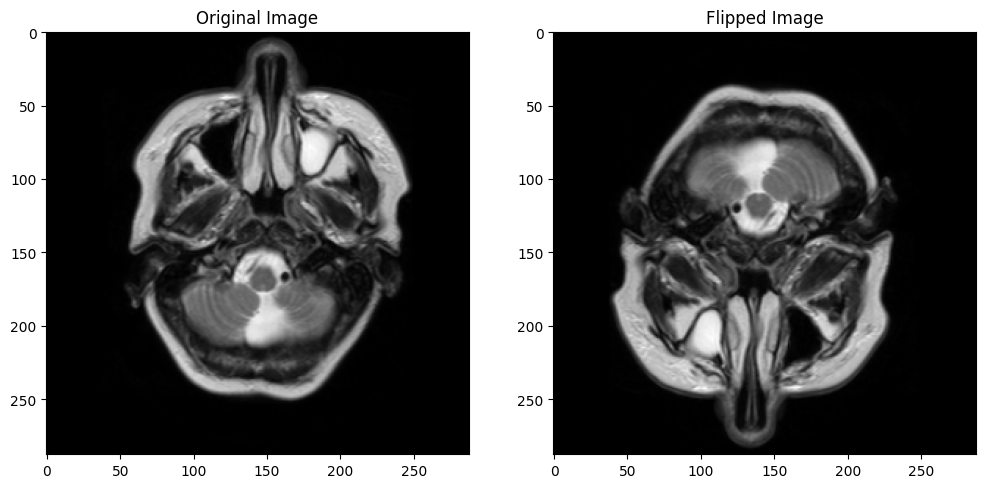

Original Series Animation:


Flipped Series Animation:


In [ ]:
def visualize_flipped_series(series_id):
    """
    Reads the DICOM series for the given series_id, applies random flip, and visualizes the original and flipped images.

    Parameters:
        series_id (str): The series identifier from series_list.

    Returns:
        None
    """
    # Read and standardize the DICOM series
    original_input = standardize_dicom(series_id)
    original_input = original_input.float()

    # Apply random flip
    flipped_input = random_flip_3d(original_input.clone())

    # Remove batch and channel dimensions for visualization
    original_input = original_input.squeeze(0).squeeze(0)  # Shape: (D, H, W)
    flipped_input = flipped_input.squeeze(0).squeeze(0)    # Shape: (D, H, W)

    # Convert tensors to numpy arrays
    original_images = original_input.numpy()
    flipped_images = flipped_input.numpy()

    # Create a list of slices for animation
    original_images_list = [original_images[i] for i in range(original_images.shape[0])]
    flipped_images_list = [flipped_images[i] for i in range(flipped_images.shape[0])]

    # Visualize the middle slice of the volume
    middle_slice = original_images.shape[0] // 2
    first_slice=0

    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_images[first_slice], cmap='gray')
    plt.title('Original Image')

    # Flipped image
    plt.subplot(1, 2, 2)
    plt.imshow(flipped_images[-1], cmap='gray')
    plt.title('Flipped Image')

    plt.show()

    # Create animations for the entire volume
    print("Original Series Animation:")
    anim_original = create_animation(original_images_list)
    display(anim_original)

    print("Flipped Series Animation:")
    anim_flipped = create_animation(flipped_images_list)
    display(anim_flipped)

# Example usage:
series_id = abnormal_series_id[0] # Replace with any valid series_id from series_list
visualize_flipped_series(series_id)

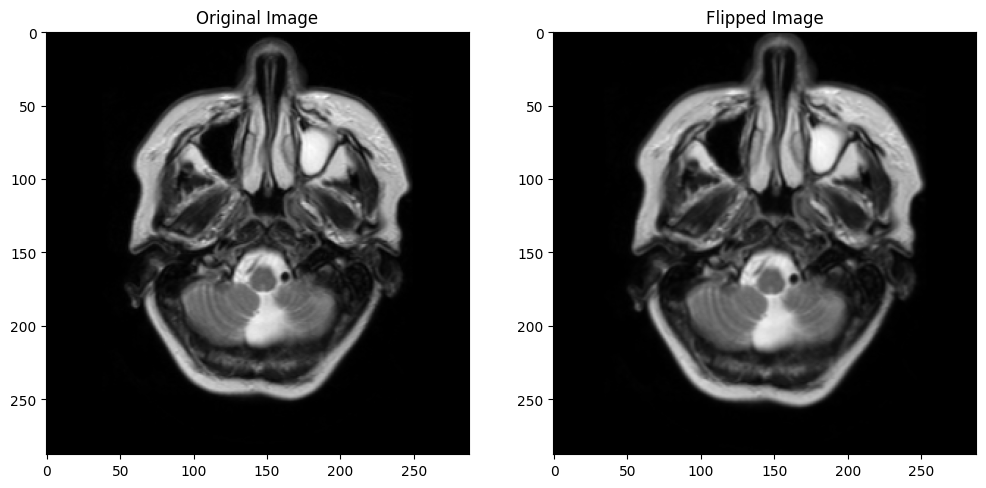

Original Series Animation:


zoomed Series Animation:


In [ ]:
def visualize_zoomed_series(series_id):
    """
    Reads the DICOM series for the given series_id, applies random flip, and visualizes the original and flipped images.

    Parameters:
        series_id (str): The series identifier from series_list.

    Returns:
        None
    """
    # Read and standardize the DICOM series
    original_input = standardize_dicom(series_id)
    original_input = original_input.float()

    # Apply random flip
    zoomed_input = random_zoom_3d(original_input.clone())

    # Remove batch and channel dimensions for visualization
    original_input = original_input.squeeze(0).squeeze(0)  # Shape: (D, H, W)
    zoomed_input = zoomed_input.squeeze(0).squeeze(0)    # Shape: (D, H, W)

    # Convert tensors to numpy arrays
    original_images = original_input.numpy()
    zoomed_images = zoomed_input.numpy()

    # Create a list of slices for animation
    original_images_list = [original_images[i] for i in range(original_images.shape[0])]
    zoomed_images_list = [zoomed_images[i] for i in range(zoomed_images.shape[0])]

    # Visualize the middle slice of the volume
    middle_slice = original_images.shape[0] // 2
    first_slice=0

    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_images[first_slice], cmap='gray')
    plt.title('Original Image')

    # Flipped image
    plt.subplot(1, 2, 2)
    plt.imshow(zoomed_images[0], cmap='gray')
    plt.title('Flipped Image')

    plt.show()

    # Create animations for the entire volume
    print("Original Series Animation:")
    anim_original = create_animation(original_images_list)
    display(anim_original)

    print("zoomed Series Animation:")
    anim_zoomed = create_animation(zoomed_images_list)
    display(anim_zoomed)

# Example usage:
series_id = abnormal_series_id[0] # Replace with any valid series_id from series_list
visualize_zoomed_series(series_id)

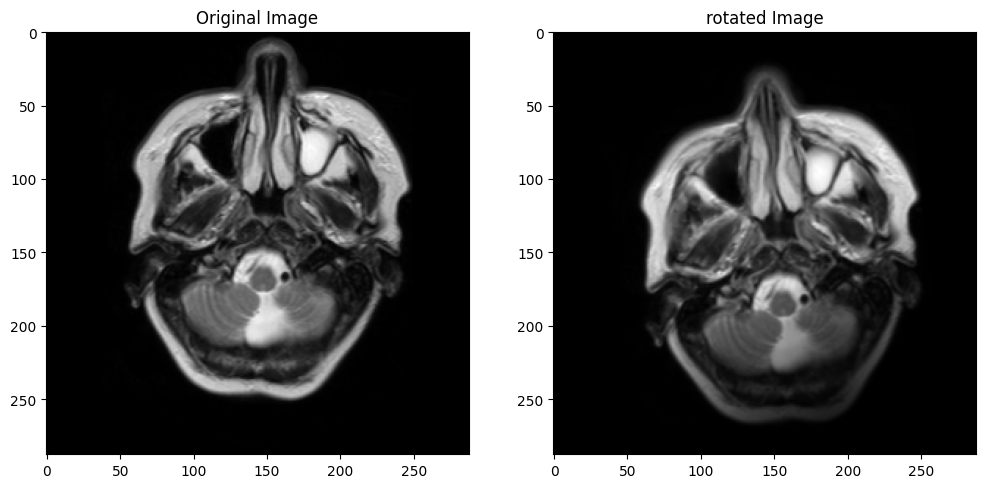

Original Series Animation:


rotated Series Animation:


In [ ]:
def visualize_rotated_series(series_id):
    """
    Reads the DICOM series for the given series_id, applies random flip, and visualizes the original and flipped images.

    Parameters:
        series_id (str): The series identifier from series_list.

    Returns:
        None
    """
    # Read and standardize the DICOM series
    original_input = standardize_dicom(series_id)
    original_input = original_input.float()

    # Apply random flip
    rotated_input = random_rotation_3d(original_input.clone())

    # Remove batch and channel dimensions for visualization
    original_input = original_input.squeeze(0).squeeze(0)  # Shape: (D, H, W)
    rotated_input = rotated_input.squeeze(0).squeeze(0)    # Shape: (D, H, W)

    # Convert tensors to numpy arrays
    original_images = original_input.numpy()
    rotated_images = rotated_input.numpy()

    # Create a list of slices for animation
    original_images_list = [original_images[i] for i in range(original_images.shape[0])]
    rotated_images_list = [rotated_images[i] for i in range(rotated_images.shape[0])]

    # Visualize the middle slice of the volume
    middle_slice = original_images.shape[0] // 2
    first_slice=0

    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_images[first_slice], cmap='gray')
    plt.title('Original Image')

    # Flipped image
    plt.subplot(1, 2, 2)
    plt.imshow(rotated_images[0], cmap='gray')
    plt.title('rotated Image')

    plt.show()

    # Create animations for the entire volume
    print("Original Series Animation:")
    anim_original = create_animation(original_images_list)
    display(anim_original)

    print("rotated Series Animation:")
    anim_rotated = create_animation(rotated_images_list)
    display(anim_rotated)

# Example usage:
series_id = abnormal_series_id[0] # Replace with any valid series_id from series_list
visualize_rotated_series(series_id)

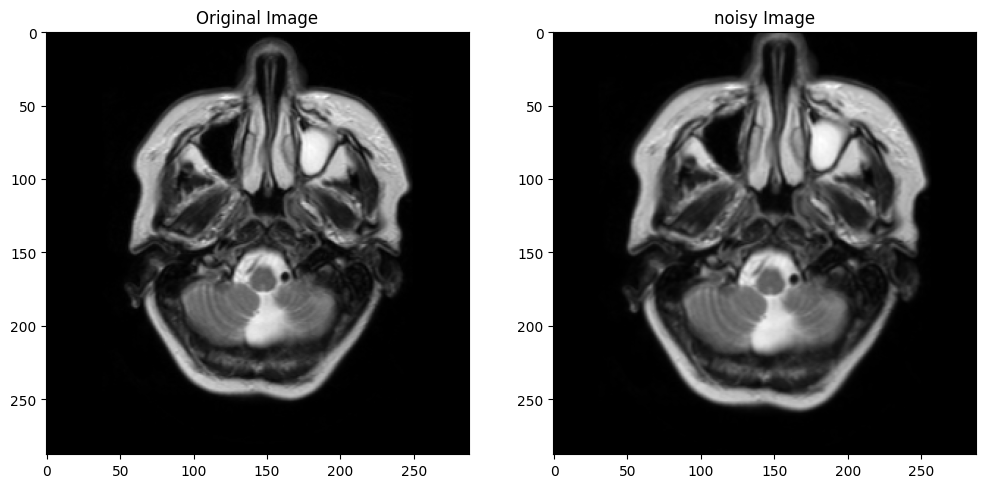

Original Series Animation:


zoomed Series Animation:


In [ ]:
def visualize_noisy_series(series_id):
    """
    Reads the DICOM series for the given series_id, applies random flip, and visualizes the original and flipped images.

    Parameters:
        series_id (str): The series identifier from series_list.

    Returns:
        None
    """
    # Read and standardize the DICOM series
    original_input = standardize_dicom(series_id)
    original_input = original_input.float()

    # Apply random flip
    noisy_input = random_zoom_3d(original_input.clone())

    # Remove batch and channel dimensions for visualization
    original_input = original_input.squeeze(0).squeeze(0)  # Shape: (D, H, W)
    noisy_input = noisy_input.squeeze(0).squeeze(0)    # Shape: (D, H, W)

    # Convert tensors to numpy arrays
    original_images = original_input.numpy()
    noisy_images = noisy_input.numpy()

    # Create a list of slices for animation
    original_images_list = [original_images[i] for i in range(original_images.shape[0])]
    noisy_images_list = [noisy_images[i] for i in range(noisy_images.shape[0])]

    # Visualize the middle slice of the volume
    middle_slice = original_images.shape[0] // 2
    first_slice=0

    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_images[first_slice], cmap='gray')
    plt.title('Original Image')

    # Flipped image
    plt.subplot(1, 2, 2)
    plt.imshow(noisy_images[0], cmap='gray')
    plt.title('noisy Image')

    plt.show()

    # Create animations for the entire volume
    print("Original Series Animation:")
    anim_original = create_animation(original_images_list)
    display(anim_original)

    print("zoomed Series Animation:")
    anim_noisy = create_animation(noisy_images_list)
    display(anim_noisy)

# Example usage:
series_id = abnormal_series_id[0] # Replace with any valid series_id from series_list
visualize_noisy_series(series_id)

In [ ]:
augmented_abnormal_series_id = np.random.choice(abnormal_series_id, 1500, replace=True)

# Normal Data
augmented_normal_series_id = np.random.choice(normal_series_id, 1500, replace=True)

# Create Datasets
augmented_abnormal_dataset = DICOMDataset(augmented_abnormal_series_id, produce_label, data_dir, transform=custom_transform)
augmented_normal_dataset = DICOMDataset(augmented_normal_series_id, produce_label, data_dir, transform=custom_transform)

# Combine Datasets
full_dataset = ConcatDataset([augmented_abnormal_dataset, augmented_normal_dataset])

# Create labels for stratification
dataset_labels = np.array(
    [1] * len(augmented_abnormal_dataset) +
    [0] * len(augmented_normal_dataset)
)

# Split indices for train and validation
indices = np.arange(len(full_dataset))
train_indices, val_indices = train_test_split(
    indices,
    test_size=0.2,
    stratify=dataset_labels,
    random_state=0
)

# Create Subsets
train_dataset = Subset(full_dataset, train_indices)
val_dataset = Subset(full_dataset, val_indices)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
